Need to have tensorflow, open-cv and tensorflow_datasets installed

In [1]:
import tensorflow as tf
import cv2
import numpy as np
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt

# Load Dataset

In [2]:
ds = tfds.load('deep_weeds', batch_size = -1, as_supervised = True)

images, labels = ds['train']

Instructions for updating:
Use `tf.data.Dataset.get_single_element()`.


Instructions for updating:
Use `tf.data.Dataset.get_single_element()`.


In [3]:
#Images are stored as tensors
images[0]

<tf.Tensor: shape=(256, 256, 3), dtype=uint8, numpy=
array([[[200, 213, 230],
        [213, 225, 239],
        [245, 255, 255],
        ...,
        [ 85, 127, 107],
        [ 62,  67,  63],
        [ 77,  65,  67]],

       [[199, 212, 229],
        [224, 236, 250],
        [232, 242, 251],
        ...,
        [ 52,  89,  72],
        [ 61,  66,  62],
        [ 81,  69,  71]],

       [[158, 170, 186],
        [230, 242, 255],
        [247, 255, 255],
        ...,
        [180, 206, 195],
        [123, 125, 122],
        [ 84,  73,  77]],

       ...,

       [[ 33,  36,  43],
        [ 33,  36,  43],
        [ 31,  35,  44],
        ...,
        [186, 192, 206],
        [ 68,  74,  88],
        [ 88,  94, 108]],

       [[ 36,  36,  44],
        [ 33,  36,  43],
        [ 31,  35,  44],
        ...,
        [103, 109, 123],
        [ 94, 100, 114],
        [ 58,  64,  78]],

       [[ 36,  36,  44],
        [ 33,  36,  43],
        [ 32,  35,  44],
        ...,
        [ 26,  32,  4

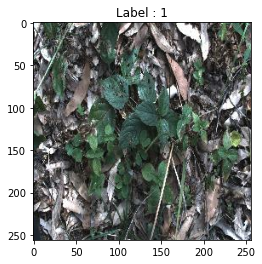

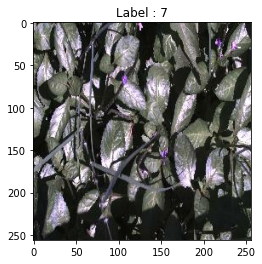

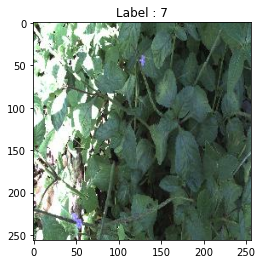

In [4]:
#Check some images
for i in range(3):
    fig , ax = plt.subplots()
    ax.imshow(images[i])
    ax.set_title("Label : " + str(labels[i].numpy()))

In [3]:
img_0 = tf.gather_nd(images, tf.where(labels == 0)).numpy()
img_1 = tf.gather_nd(images, tf.where(labels == 1)).numpy()
img_2 = tf.gather_nd(images, tf.where(labels == 2)).numpy()
img_3 = tf.gather_nd(images, tf.where(labels == 3)).numpy()
img_4 = tf.gather_nd(images, tf.where(labels == 4)).numpy()
img_5 = tf.gather_nd(images, tf.where(labels == 5)).numpy()
img_6 = tf.gather_nd(images, tf.where(labels == 6)).numpy()
img_7 = tf.gather_nd(images, tf.where(labels == 7)).numpy()
img_8 = tf.gather_nd(images, tf.where(labels == 8)).numpy()

img_sorted = [img_0, img_1, img_2, img_3, img_4, img_5, img_6, img_7, img_8]

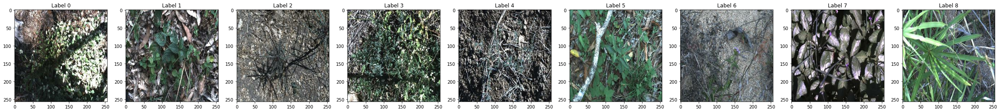

In [6]:
fig = plt.figure(figsize = (40,40))

for i in range(9):
    ax = fig.add_subplot(1, 9, i + 1)
    plt.imshow(img_sorted[i][0])
    ax.set_title(f"Label {i}")

# Feature Engineering

Properties of Images which will be extracted and analysed

1. Average RBG values
2. Average Intensity (Convert to greyscale)
3. Compare Histogram
4. Comparing Edge Pictures
5. Apply filters like the gaussian and take average after
6. Comparing Gradient images

In [7]:
img = images[0]

In [8]:
def normalize_img(img):
    return img/255

normalize_img(img)

<tf.Tensor: shape=(256, 256, 3), dtype=float32, numpy=
array([[[0.78431374, 0.8352941 , 0.9019608 ],
        [0.8352941 , 0.88235295, 0.9372549 ],
        [0.9607843 , 1.        , 1.        ],
        ...,
        [0.33333334, 0.49803922, 0.41960785],
        [0.24313726, 0.2627451 , 0.24705882],
        [0.3019608 , 0.25490198, 0.2627451 ]],

       [[0.78039217, 0.83137256, 0.8980392 ],
        [0.8784314 , 0.9254902 , 0.98039216],
        [0.9098039 , 0.9490196 , 0.9843137 ],
        ...,
        [0.20392157, 0.34901962, 0.28235295],
        [0.23921569, 0.25882354, 0.24313726],
        [0.31764707, 0.27058825, 0.2784314 ]],

       [[0.61960787, 0.6666667 , 0.7294118 ],
        [0.9019608 , 0.9490196 , 1.        ],
        [0.96862745, 1.        , 1.        ],
        ...,
        [0.7058824 , 0.80784315, 0.7647059 ],
        [0.48235294, 0.49019608, 0.47843137],
        [0.32941177, 0.28627452, 0.3019608 ]],

       ...,

       [[0.12941177, 0.14117648, 0.16862746],
        [0.12

Text(0.5, 1.0, 'After')

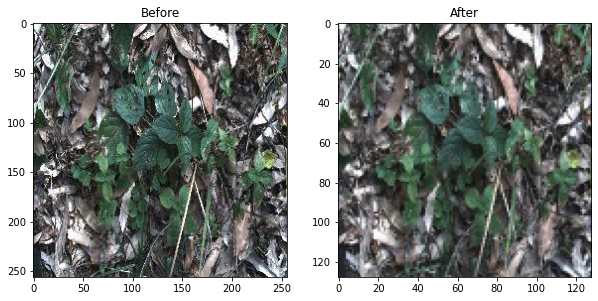

In [9]:
def re_size(img, new_size):
    return cv2.resize(img, new_size)


fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,2,1)
plt.imshow(img)
ax.set_title("Before")



ax = fig.add_subplot(1,2,2)
plt.imshow(re_size(img.numpy(), (128,128)))
ax.set_title("After")

Text(0.5, 1.0, 'After')

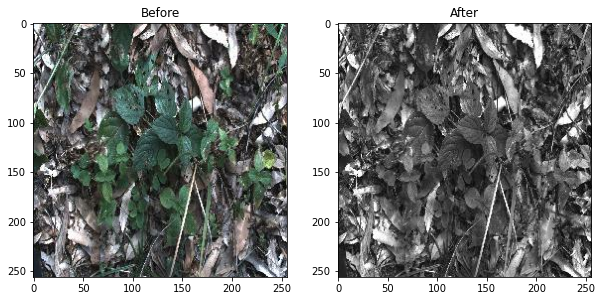

In [10]:
def conv_greyscale(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,2,1)
plt.imshow(img)
ax.set_title("Before")



ax = fig.add_subplot(1,2,2)
plt.imshow(conv_greyscale(img.numpy()), cmap = 'gray')
ax.set_title("After")

# Pre Processing

## Histogram equalization

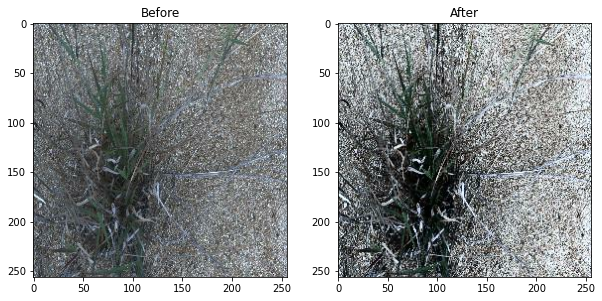

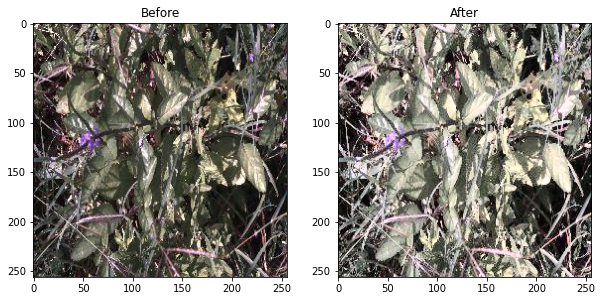

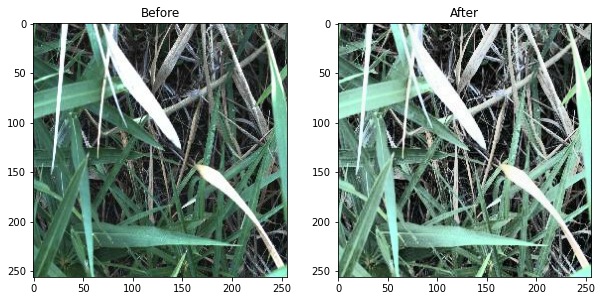

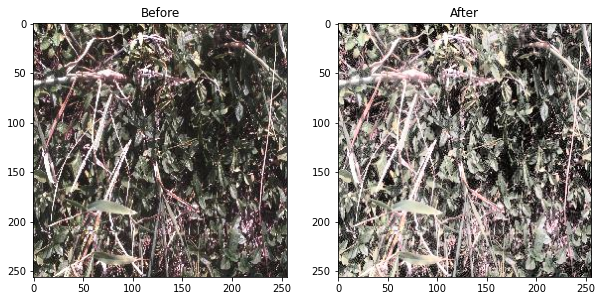

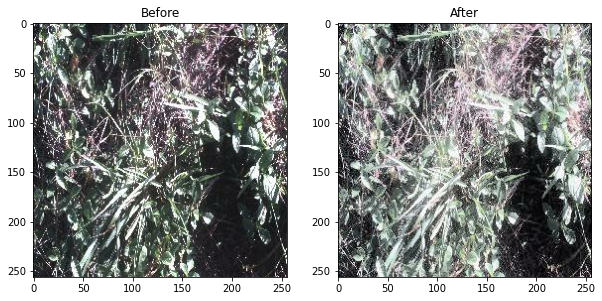

In [4]:
def histogram_equalization(img):
    img_yuv = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img_yuv[:,:,0] = cv2.equalizeHist(img_yuv[:,:,0])
    img_output = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2RGB)
    return img_output

for i in range(5):
    i = np.random.randint(len(images))
    img = images[i].numpy()
    
    fig = plt.figure(figsize = (10,10))
    ax = fig.add_subplot(1,2,1)
    plt.imshow(img)
    ax.set_title("Before")

    img_output = histogram_equalization(img)

    ax = fig.add_subplot(1,2,2)
    plt.imshow(img_output)
    ax.set_title("After")

## Application of Different Blurs

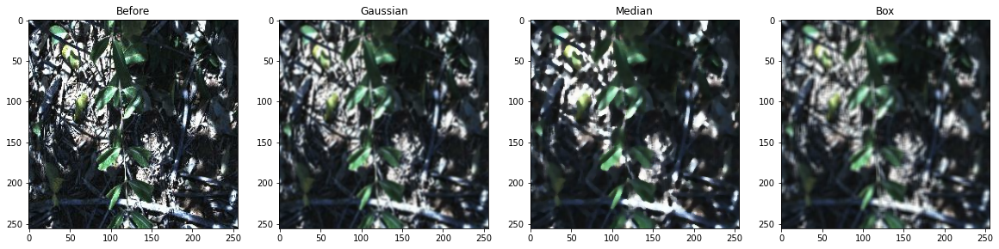

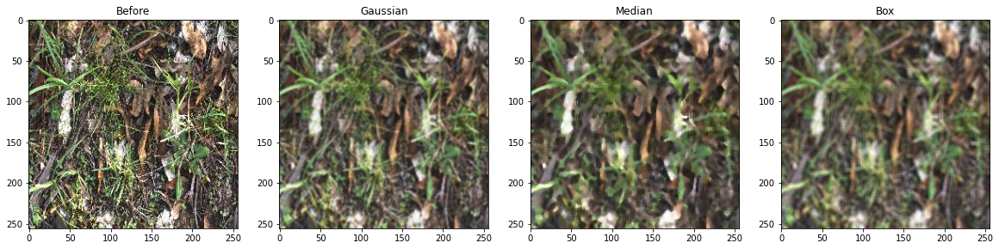

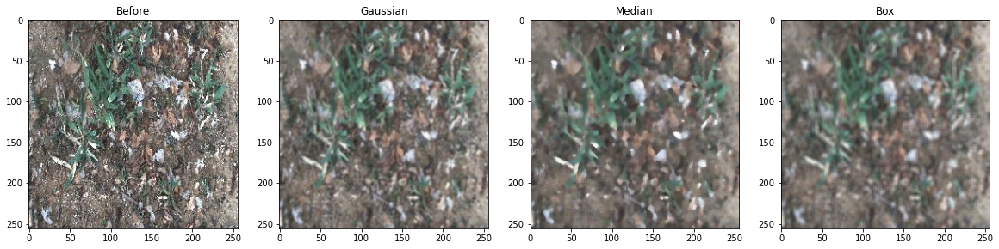

In [12]:
def gaussian_filter(img, kernel_size):
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def median_filter(img, kernel_size):
    return cv2.medianBlur(img, kernel_size)

def box_filter(img, kernel_size):
    return cv2.blur(img , (kernel_size, kernel_size))


for i in range(3):
    i = np.random.randint(len(images))
    img = images[i].numpy()
    fig = plt.figure(figsize = (20,20))
    ax = fig.add_subplot(1,4,1)
    plt.imshow(img)
    ax.set_title("Before")
    
    gaussian = gaussian_filter(img, 5)
    median = median_filter(img , 5)
    box = box_filter(img , 5)
    
    
    ax = fig.add_subplot(1,4,2)
    plt.imshow(gaussian)
    ax.set_title("Gaussian")
    
    ax = fig.add_subplot(1,4,3)
    plt.imshow(median)
    ax.set_title("Median")
    
    ax = fig.add_subplot(1,4,4)
    plt.imshow(box)
    ax.set_title("Box")


## Gradient Images

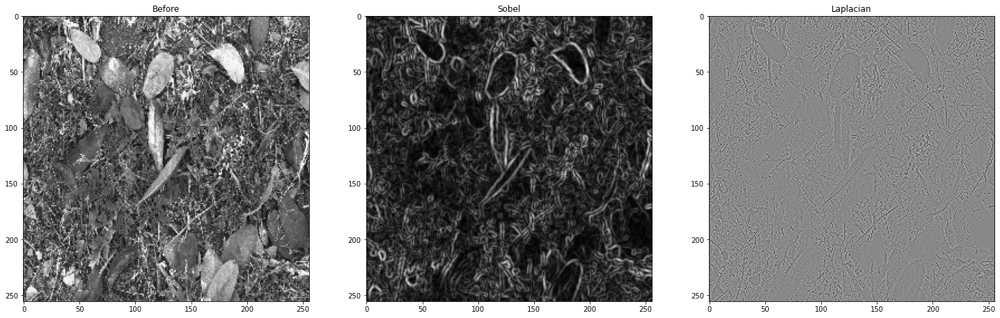

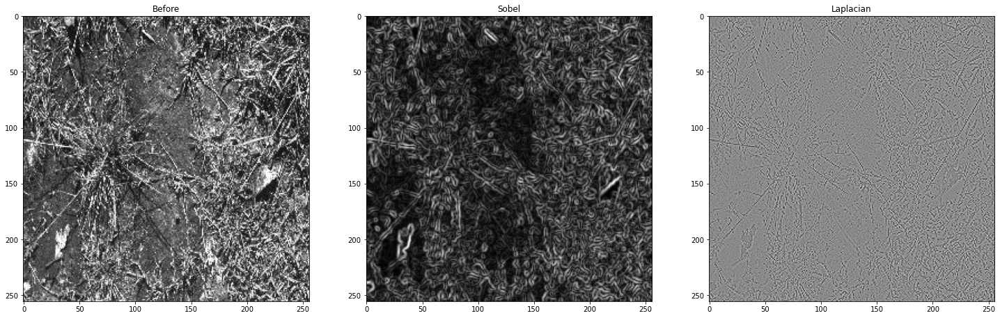

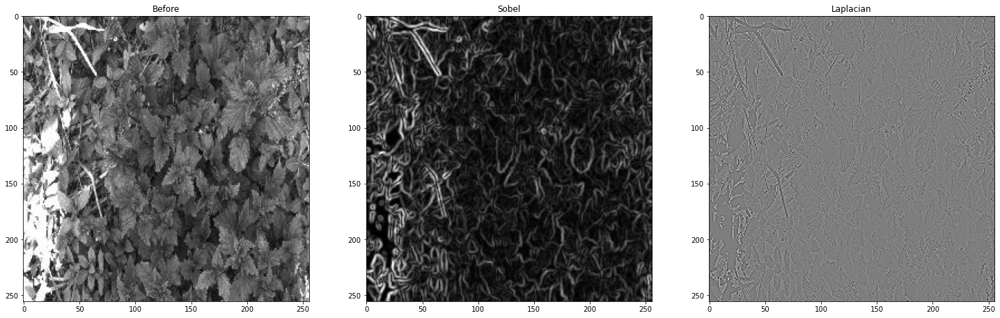

In [13]:
def sobel_filter(img, kernel_size):
    sobelx = cv2.Sobel(img, cv2.CV_64F,1,0, ksize = kernel_size)
    sobely = cv2.Sobel(img, cv2.CV_64F,0,1, ksize = kernel_size)
    sobel = np.sqrt(sobelx**2 + sobely**2)
    return sobel

def laplacian_filter(img):
    return cv2.Laplacian(img, cv2.CV_64F)

for i in range(3):
    i = np.random.randint(len(images))
    img = images[i].numpy()
    img = conv_greyscale(img)
    fig = plt.figure(figsize = (25,25))
    ax = fig.add_subplot(1,3,1)
    plt.imshow(img, cmap = 'gray')
    ax.set_title("Before")
    
    sobel = sobel_filter(img, 5)
    laplacian = laplacian_filter(img)
    
    ax = fig.add_subplot(1,3,2)
    plt.imshow(sobel, cmap = 'gray')
    ax.set_title("Sobel")
    
    ax = fig.add_subplot(1,3,3)
    plt.imshow(laplacian, cmap = 'gray')
    ax.set_title("Laplacian")

# CNN

## Taking a sample and spiting in training and test datasets

In [1]:
import tensorflow as tf
import cv2
import numpy as np
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt

In [2]:
ds = tfds.load('deep_weeds', batch_size = -1, as_supervised = True, shuffle_files=True)

images, labels = ds['train']

Instructions for updating:
Use `tf.data.Dataset.get_single_element()`.


Instructions for updating:
Use `tf.data.Dataset.get_single_element()`.


## Shuffle and split into input X and label y

In [3]:
train_X = images[:14000]
train_y = labels[:14000]


test_X = images[14000:]
test_y = labels[14000:]

"""
for i in train_img_n_label:
    train_X.append(histogram_equalization(i[0].numpy()))
    train_y.append(i[1])

for i in test_img_n_label:
    test_X.append(histogram_equalization(i[0].numpy()))
    test_y.append(i[1])
    
train_X = np.array(train_X)
train_y = np.array(train_y)

test_X = np.array(test_X)
test_y = np.array(test_y)
"""

'\nfor i in train_img_n_label:\n    train_X.append(histogram_equalization(i[0].numpy()))\n    train_y.append(i[1])\n\nfor i in test_img_n_label:\n    test_X.append(histogram_equalization(i[0].numpy()))\n    test_y.append(i[1])\n    \ntrain_X = np.array(train_X)\ntrain_y = np.array(train_y)\n\ntest_X = np.array(test_X)\ntest_y = np.array(test_y)\n'

In [4]:
from tensorflow.keras import datasets, layers, models, regularizers
import datetime

In [5]:
%load_ext tensorboard

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [13]:
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
%reload_ext tensorboard

In [6]:
model = models.Sequential()

model.add(layers.Conv2D(96, (11, 11), activation='relu', input_shape=(256, 256, 3), strides = 4))
model.add(layers.MaxPooling2D((3, 3), strides = 2))
model.add(layers.BatchNormalization())

model.add(layers.Conv2D(256, (5, 5), activation='relu', padding = 'same'))
model.add(layers.MaxPooling2D((3, 3), strides = 2))

model.add(layers.Conv2D(192, (3, 3), activation='relu', padding = 'same'))
model.add(layers.Conv2D(192, (3, 3), activation='relu', padding = 'same'))
model.add(layers.Conv2D(128, (3, 3), activation='relu', padding = 'same'))
model.add(layers.MaxPooling2D((3, 3), strides = 2))
model.add(layers.BatchNormalization())

model.add(layers.Flatten())

model.add(layers.Dense(4096, activation='relu'))
model.add(layers.Dropout(0.25))

model.add(layers.Dense(4096, activation='relu'))
model.add(layers.Dropout(0.25))

model.add(layers.Dense(9))

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 62, 62, 96)        34944     
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 30, 30, 96)        0         
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 96)        384       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 30, 30, 256)       614656    
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 14, 14, 256)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 14, 14, 192)       442560    
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 14, 14, 192)       3

In [12]:
%tensorboard --logdir logs --host localhost --port 192

In [7]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])




model.fit(train_X, train_y, epochs=15, 
                    validation_data=(test_X, test_y), callbacks=[tensorboard_callback], batch_size = 16)

Epoch 1/15
875/875 [==============================] - 31s 32ms/step - loss: 1.6219 - accuracy: 0.5088 - val_loss: 2.1715 - val_accuracy: 0.4725
Epoch 2/15
875/875 [==============================] - 28s 32ms/step - loss: 1.3715 - accuracy: 0.5300 - val_loss: 1.8976 - val_accuracy: 0.5121
Epoch 3/15
875/875 [==============================] - 27s 31ms/step - loss: 1.3437 - accuracy: 0.5399 - val_loss: 1.5675 - val_accuracy: 0.4933
Epoch 4/15
875/875 [==============================] - 27s 31ms/step - loss: 1.2835 - accuracy: 0.5506 - val_loss: 2.1635 - val_accuracy: 0.5152
Epoch 5/15
875/875 [==============================] - 27s 31ms/step - loss: 1.2315 - accuracy: 0.5654 - val_loss: 4.0425 - val_accuracy: 0.1054
Epoch 6/15
875/875 [==============================] - 28s 32ms/step - loss: 1.2283 - accuracy: 0.5669 - val_loss: 1.6193 - val_accuracy: 0.4813
Epoch 7/15
875/875 [==============================] - 29s 34ms/step - loss: 1.2234 - accuracy: 0.5697 - val_loss: 1.2176 - val_accuracy:

In [ ]:
model.evaluate(test_X,test_y)

242/266 [==========================>...] - ETA: 0s - loss: 1.9277 - accuracy: 0.5687